# A method for classifying hydrological alteration

In [1]:
from hidrocomp.series import Flow
import math
import pandas as pd
import plotly as py

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [3]:
flow_ons.month_num_flood, flow_ons.month_abr_flood

(8, 'AS-AUG')

In [4]:
flow = flow_ana.data.combine_first(flow_sar.data).combine_first(flow_ons.data)
flow

,66160000,66231000,A19086,D19086,MANSO
1972-08-07,11.2110,NaN,NaN,NaN,NaN
1972-08-08,11.2110,NaN,NaN,NaN,NaN
1972-08-09,11.6272,NaN,NaN,NaN,NaN
1972-08-10,11.6272,NaN,NaN,NaN,NaN
1972-08-11,11.6272,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-07-18,NaN,NaN,41.94,121.0,NaN
2020-07-19,NaN,NaN,34.02,121.0,NaN
2020-07-20,NaN,NaN,41.93,121.0,NaN
2020-07-21,NaN,NaN,34.02,121.0,NaN


In [5]:
flow = Flow(data=flow)

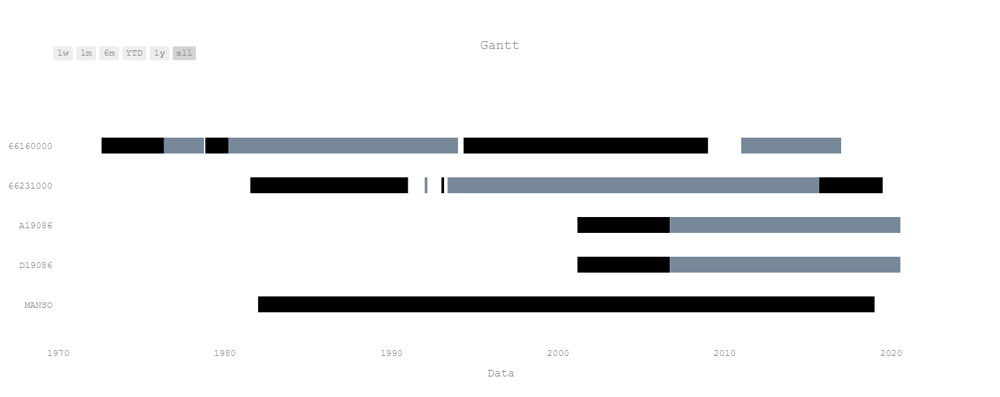

In [6]:
fig_gantt, data_gantt = flow.gantt("Gantt")
py.offline.iplot(fig_gantt)

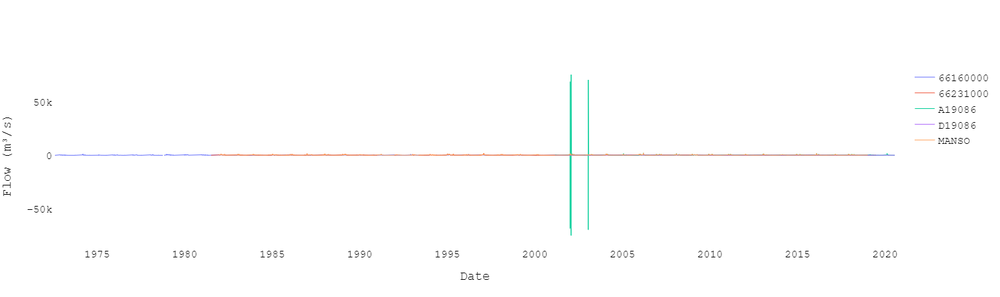

In [7]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

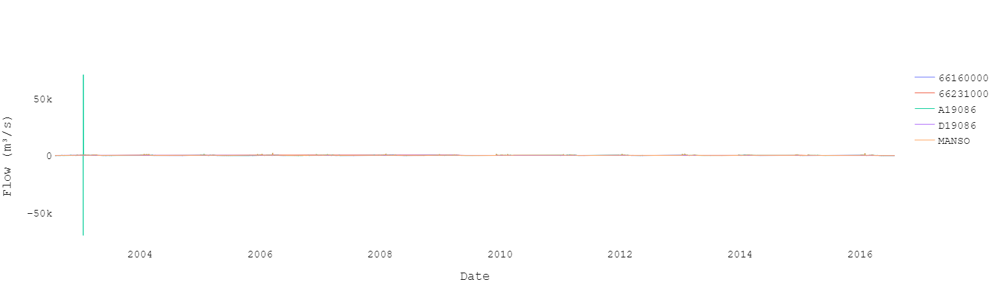

In [8]:
start_filling = "01/08/2002"
end_filling = "31/07/2016"
flow.date(date_start=start_filling, date_end=end_filling)
fig_start_filling_hydro, data_start_filling_hydro = flow.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

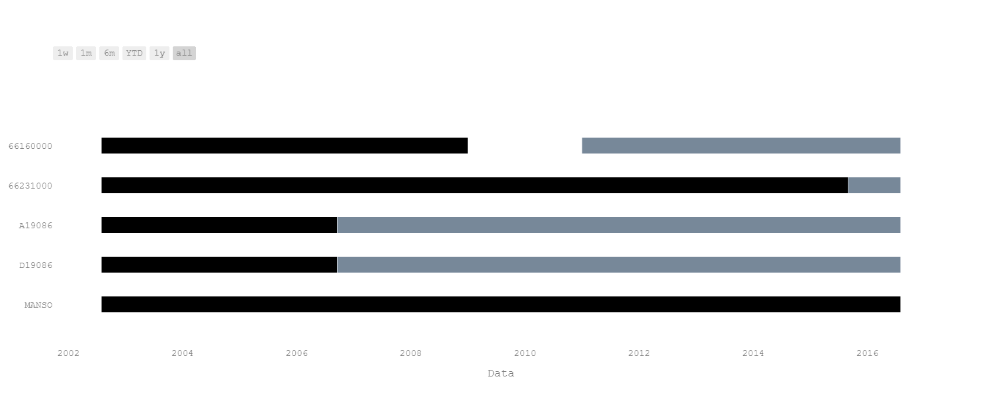

In [9]:
fig_start_filling_gantt, data_start_filling_gantt = flow.gantt("")
py.offline.iplot(fig_start_filling_gantt)

## Interpolar dados

In [10]:
nulls = flow.data["66231000"].isnull()
date_start = flow.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow.data.loc[nulls].index[0]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow.data["66231000"][date] = flow.data["D19086"][date] + delta
    delta = flow.data["66231000"][date] - flow.data["D19086"][date]
    
flow.data["66231000"][date_end]

120.083

Variables: 
- Magnitude:
    - 1-day maximum
    - 1-day minimum
- Duration:
    - High pulse duration
    - Low pulse duration
- Frequency:
    - High pulse count
    - Low pulse count
- Timing:
    - Date of maximum
    - Date of minimum

# Control x Impact

In [11]:
area_sb = 4260
area_ss = 9580
f"66160000: {area_sb} km²  66231000: {area_ss} km²"

'66160000: 4260 km²  66231000: 9580 km²'

In [12]:
alpha = area_ss/area_sb
alpha

2.248826291079812

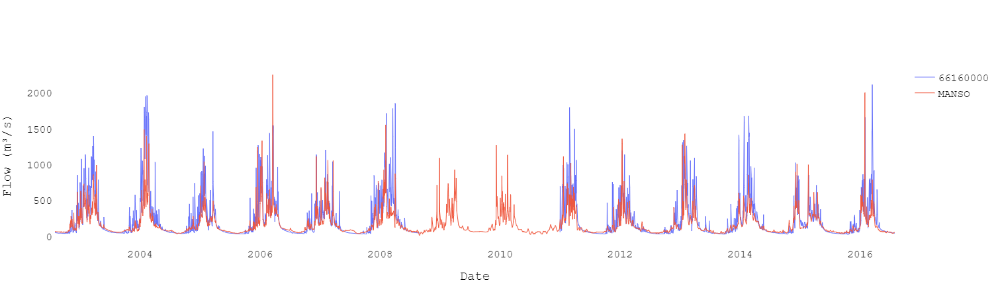

In [13]:
# del 01/09/2008 - 31/12/2008
date_del = pd.date_range(start=pd.to_datetime("31/08/2008", dayfirst=True), end=pd.to_datetime("31/12/2008", dayfirst=True))
data_mod = pd.DataFrame(flow.data["66160000"].drop(date_del, axis=0)*alpha)
data = data_mod.combine_first(pd.DataFrame(flow.data["MANSO"]))
data = Flow(data=data)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

In [14]:
# data.station = "66160000"
# data.date(date_start="01/09/2001")
# data_max = data.maximum()
threshold_high = data.data["66160000"].quantile(0.75)
f"Threshold: {threshold_high}"

'Threshold: 295.7701314553991'

In [15]:
# data_min = data.minimum()
threshold_low = data.data["66160000"].quantile(0.50) # data_min.peaks.max().values[0]
f"Threshold: {threshold_low}"

'Threshold: 95.69340563380281'

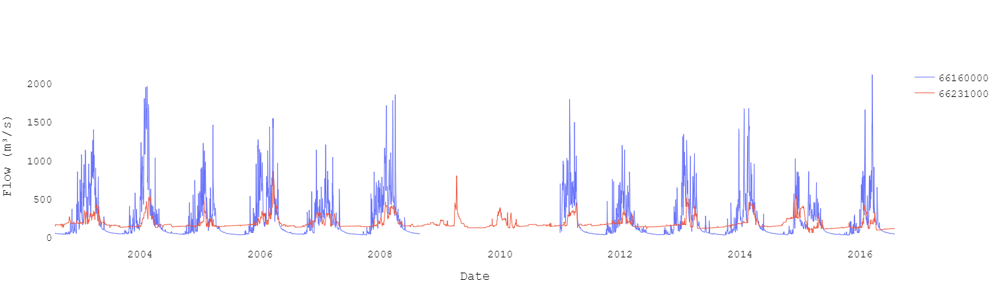

In [16]:
data_mod = pd.DataFrame(flow.data["66160000"].drop(date_del, axis=0)*alpha)
data = data_mod.combine_first(pd.DataFrame(flow.data["66231000"]))
data = Flow(data=data)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

# Parte 1

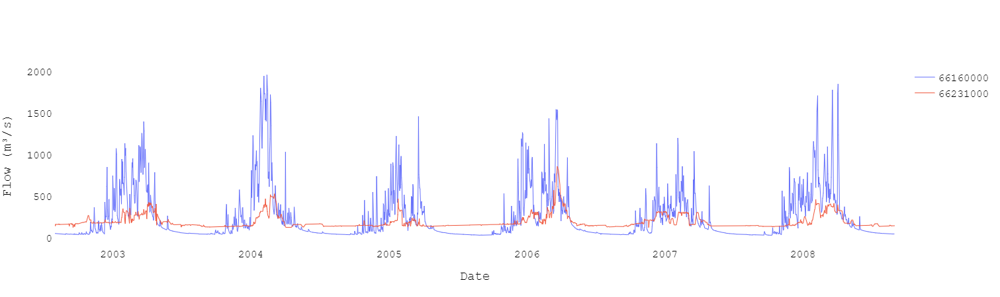

In [17]:
date_end = "31/08/2008"
data.date(date_end=date_end)
data_fig, data_data = data.hydrogram("")
py.offline.iplot(data_fig)

In [18]:
date_end = "31/08/2008"
data_nat = Flow(data=pd.DataFrame(flow.data["66160000"].drop(date_del, axis=0)*alpha)).date(date_end=date_end)
data_obs = Flow(data=pd.DataFrame(flow.data["66231000"])).date(date_end=date_end)


## Station 66160000

## Iha

In [19]:
iha_pre = data_nat.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [20]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,631.015346,1354.065599
1-day minimum,4.899020,35.200332
High pulse count,8.317861,6.571429
High pulse duration,3.277328,7.073498
Low pulse count,4.066075,3.071429
Low pulse duration,11.661934,28.030556
Date of maximum,58.591402,89.428571
Date of minimum,18.197331,252.857143


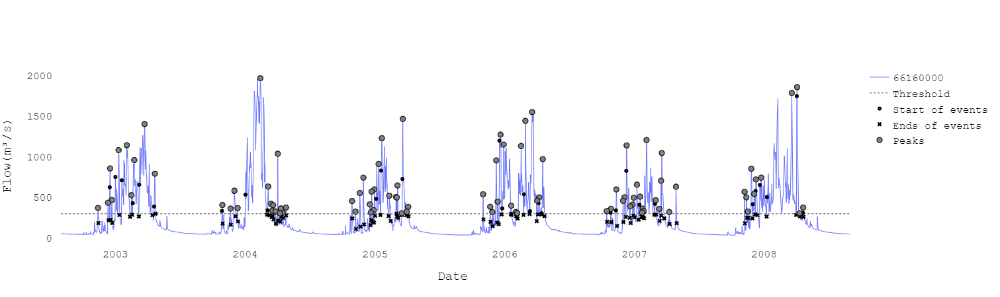

In [21]:
fig_events_high, data_events_high = iha_pre.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high)

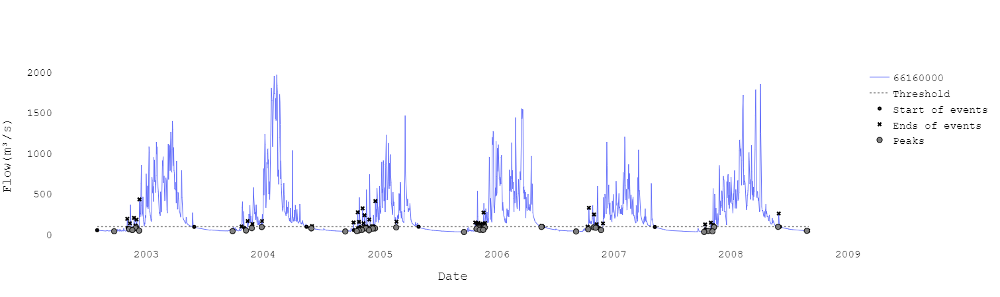

In [22]:
fig_events_low, data_events_low = iha_pre.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low)

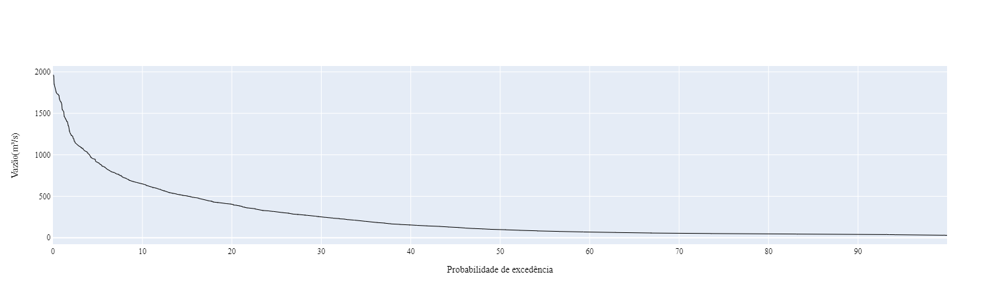

In [23]:
fig, data = data_nat.rating_curve()
py.offline.iplot(fig)

In [24]:
iha_pre.frequency_and_duration.events_high().peaks

,Duration,End,Peaks,Start
Date,,,,
2004-02-13,61.0,2004-03-03,1963.283822,2004-01-02
2008-04-03,7.0,2008-04-09,1853.118319,2008-04-02
2008-03-19,82.0,2008-03-31,1781.931723,2008-01-09
2006-03-19,19.0,2006-04-01,1546.722484,2006-03-13
2005-03-20,11.0,2005-03-30,1462.195850,2005-03-19
...,...,...,...,...
2004-04-16,1.0,2004-04-17,305.937075,2004-04-16
2005-03-17,1.0,2005-03-18,301.689042,2005-03-17
2006-02-05,1.0,2006-02-06,301.689042,2006-02-05


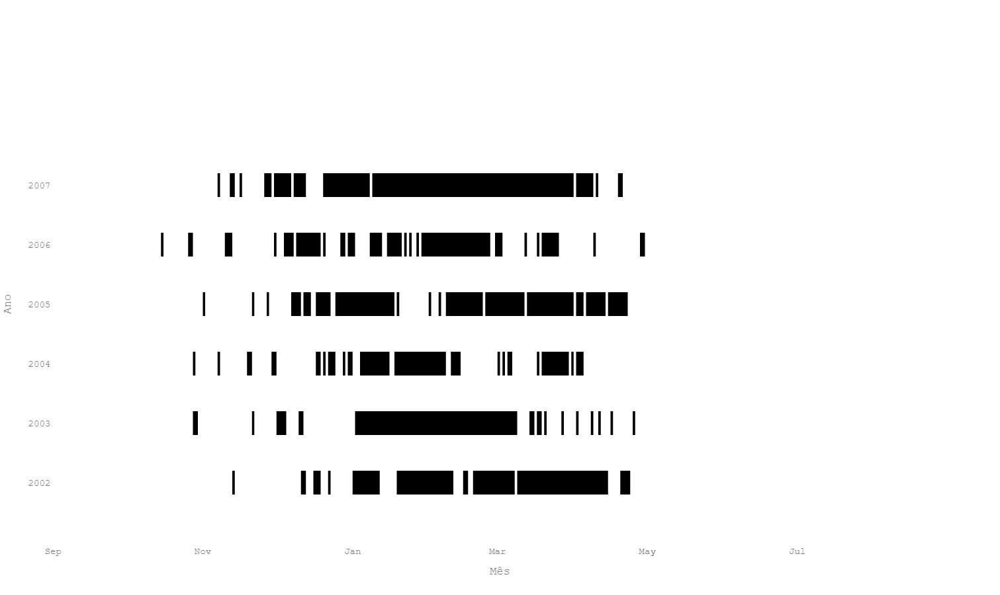

In [25]:
fig_events_spells_high, data_events_spells_high = iha_pre.frequency_and_duration.events_high().plot_spells("")
py.offline.iplot(fig_events_spells_high)

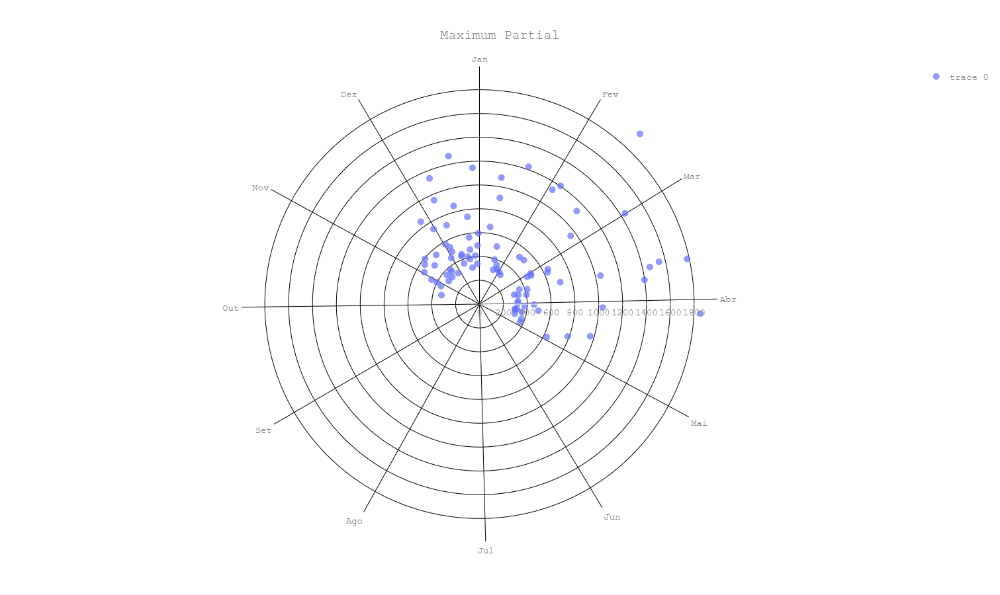

In [26]:
fig_events_polar_high, data_events_polar_high = iha_pre.frequency_and_duration.events_high().plot_polar()
py.offline.iplot(fig_events_polar_high)

## Station 66231000

In [27]:
iha_pos = data_obs.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1,  
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [28]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,212.227596,461.785571
1-day minimum,6.207329,130.204000
High pulse count,3.995189,2.500000
High pulse duration,7.741036,11.696296
Low pulse count,0.000000,0.000000
Low pulse duration,NaN,NaN
Date of maximum,118.902521,124.857143
Date of minimum,99.685697,205.714286


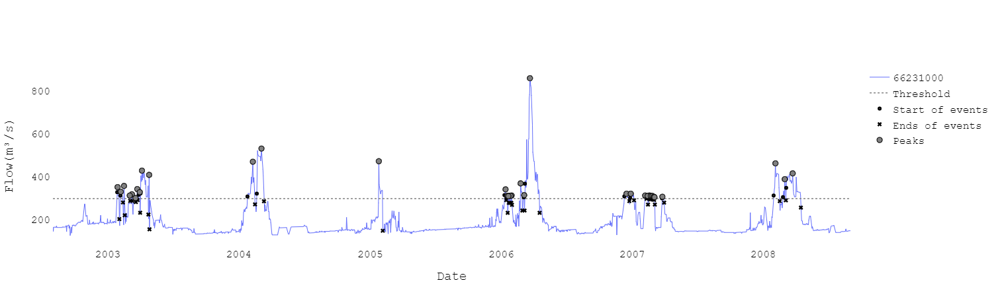

In [29]:
fig_events_high_pos, data_events_high_pos = iha_pos.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high_pos)

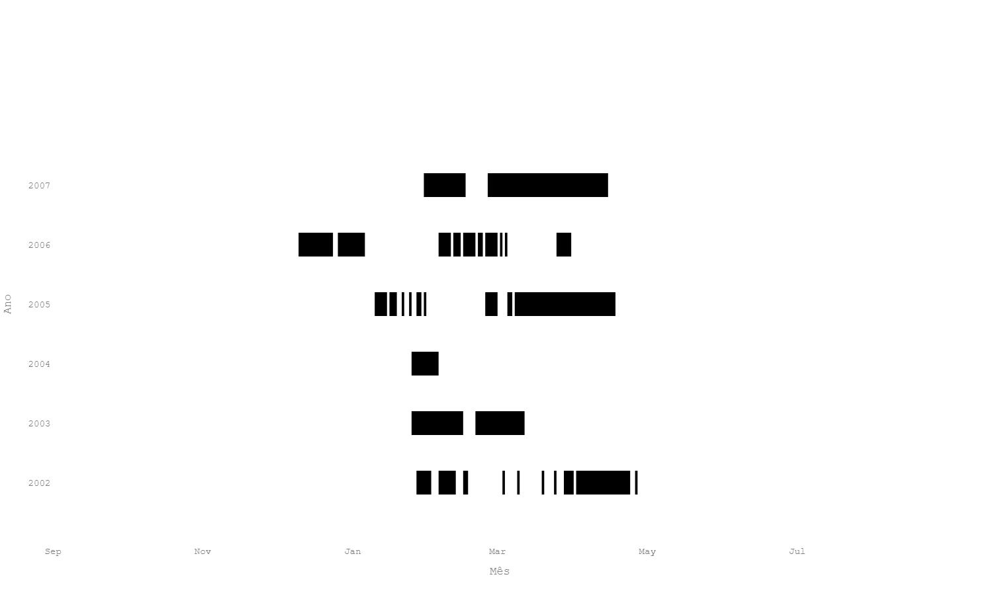

In [30]:
fig_events_spells_high_pos, data_events_spells_high_pos = iha_pos.frequency_and_duration.events_high().plot_spells("")
py.offline.iplot(fig_events_spells_high_pos)

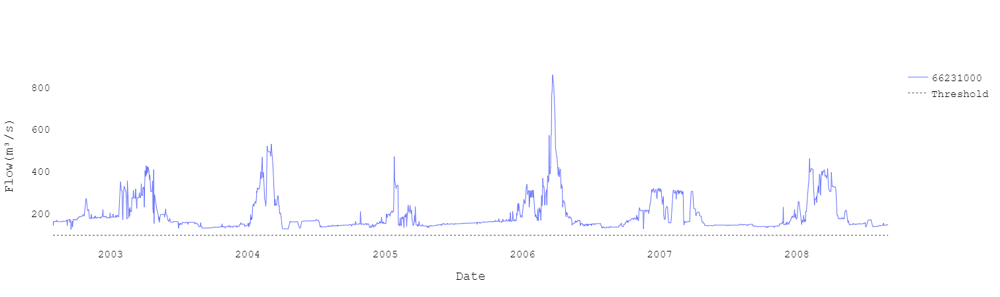

In [31]:
fig_events_low_pos, data_events_low_pos = iha_pos.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

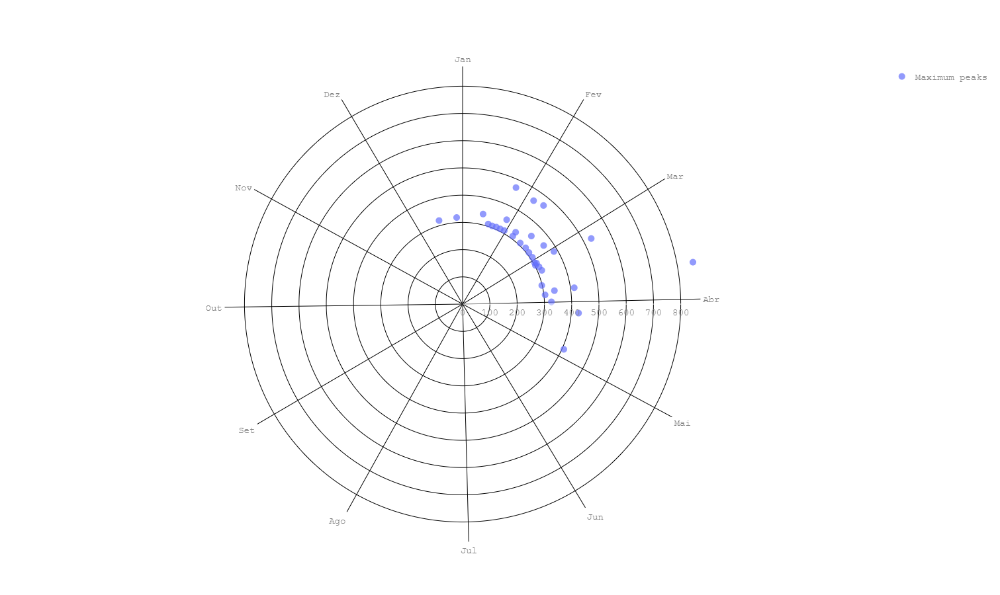

In [32]:
fig_events_polar_high_pos, data_events_polar_high_pos = iha_pos.frequency_and_duration.events_high().plot_polar("")
py.offline.iplot(fig_events_polar_high_pos)

In [33]:
cha = iha_pre.cha(iha_obs=iha_pos)

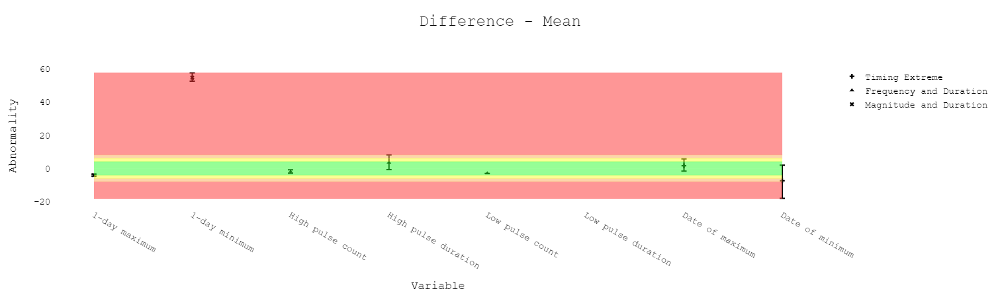

In [34]:
fig, data = cha.plot(data_type="mean")
py.offline.iplot(fig)